In [71]:
#Import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

### Read in Data

In [72]:
#Read in data
df=pd.read_csv(r'C:\Users\Kuro\Python for Analysis\movies.csv')

In [73]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [74]:
pd.set_option('display.max_rows',None)

### Data Cleaning

In [75]:
#Check null value
df.isnull().values.any()

True

In [76]:
df.isnull().sum()

name           0
rating        77
genre          0
year           0
released       2
score          3
votes          3
director       0
writer         3
star           1
country        3
budget      2171
gross        189
company       17
runtime        4
dtype: int64

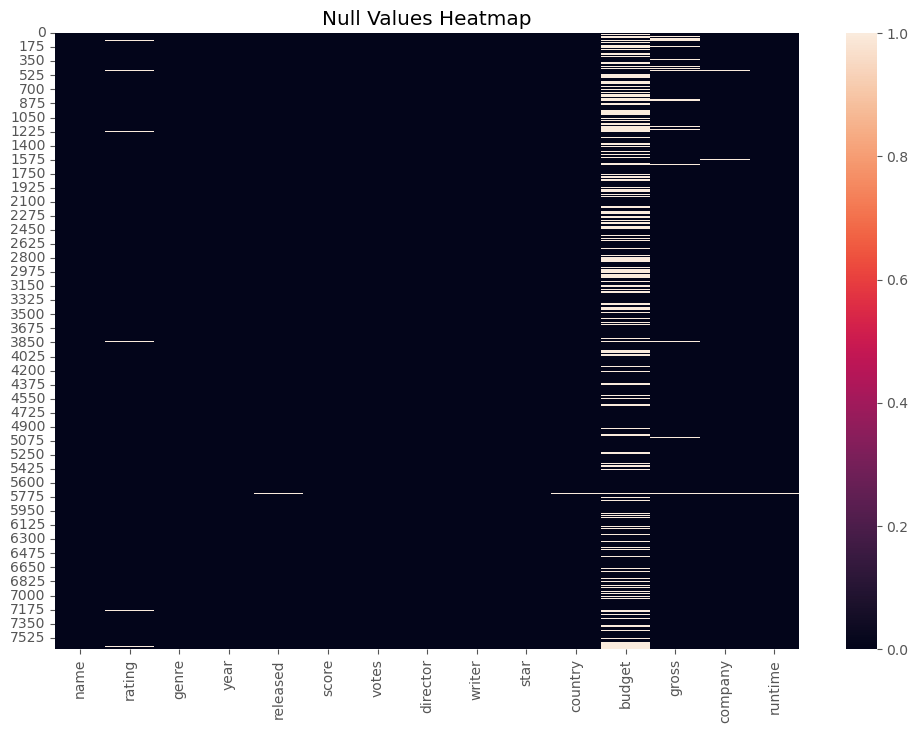

In [77]:
sns.heatmap(df.isnull(), cbar=True)
plt.title('Null Values Heatmap')
plt.show()

rating, released, score, votes, writer, star, country, budget, gross, company, runtime có null

In [38]:
#Fill null data
# Handle 'rating' column - create a mapping for categorical ratings to numeric values
rating_mapping = {'G': 1, 'PG': 2, 'PG-13': 3, 'R': 4, 'NC-17': 5}
df['rating'] = df['rating'].map(rating_mapping).fillna(df['rating'])

# Convert 'rating' to float where possible, and fill NaNs with the mean rating
df['rating'] = pd.to_numeric(df['rating'], errors='coerce')
df['rating'].fillna(df['rating'].mean(), inplace=True)

# Fill missing values in other numeric columns with mean or median
df['score'].fillna(df['score'].mean(), inplace=True)
df['votes'].fillna(df['votes'].mean(), inplace=True)
df['budget'].fillna(df['budget'].median(), inplace=True)
df['gross'].fillna(df['gross'].median(), inplace=True)
df['runtime'].fillna(df['runtime'].mean(), inplace=True)

# Fill missing values in string columns with mode
df['released'].fillna(df['released'].mode()[0], inplace=True)
df['writer'].fillna(df['writer'].mode()[0], inplace=True)
df['star'].fillna(df['star'].mode()[0], inplace=True)
df['country'].fillna(df['country'].mode()[0], inplace=True)
df['company'].fillna(df['company'].mode()[0], inplace=True)

# Check if there are any remaining null values
print(df.isnull().sum())

name        0
rating      0
genre       0
year        0
released    0
score       0
votes       0
director    0
writer      0
star        0
country     0
budget      0
gross       0
company     0
runtime     0
dtype: int64


In [39]:
#Check data type
df.dtypes

name         object
rating      float64
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [40]:
#Change data type
df['budget']=df['budget'].astype('int64')
df['gross']=df['gross'].astype('int64')

In [41]:
#Drop duplicates
df['company']=df['company'].drop_duplicates()

### Data correlation

In [42]:
df.sort_values(by=['gross'],inplace =False,ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,Avatar,3.000000,Action,2009,"December 18, 2009 (United States)",7.800000,1.100000e+06,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,NaN,162.000000
7445,Avengers: Endgame,3.000000,Action,2019,"April 26, 2019 (United States)",8.400000,9.030000e+05,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,NaN,181.000000
3045,Titanic,3.000000,Drama,1997,"December 19, 1997 (United States)",7.800000,1.100000e+06,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,NaN,194.000000
6663,Star Wars: Episode VII - The Force Awakens,3.000000,Action,2015,"December 18, 2015 (United States)",7.800000,8.760000e+05,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,NaN,138.000000
7244,Avengers: Infinity War,3.000000,Action,2018,"April 27, 2018 (United States)",8.400000,8.970000e+05,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,NaN,149.000000
7480,The Lion King,2.000000,Animation,2019,"July 19, 2019 (United States)",6.900000,2.220000e+05,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,NaN,118.000000
6653,Jurassic World,3.000000,Action,2015,"June 12, 2015 (United States)",7.000000,5.930000e+05,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,NaN,124.000000
6043,The Avengers,3.000000,Action,2012,"May 4, 2012 (United States)",8.000000,1.300000e+06,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.000000
6646,Furious 7,3.000000,Action,2015,"April 3, 2015 (United States)",7.100000,3.700000e+05,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,NaN,137.000000
7494,Frozen II,2.000000,Animation,2019,"November 22, 2019 (United States)",6.800000,1.480000e+05,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,NaN,103.000000


Find column that is most correlated with 'gross'

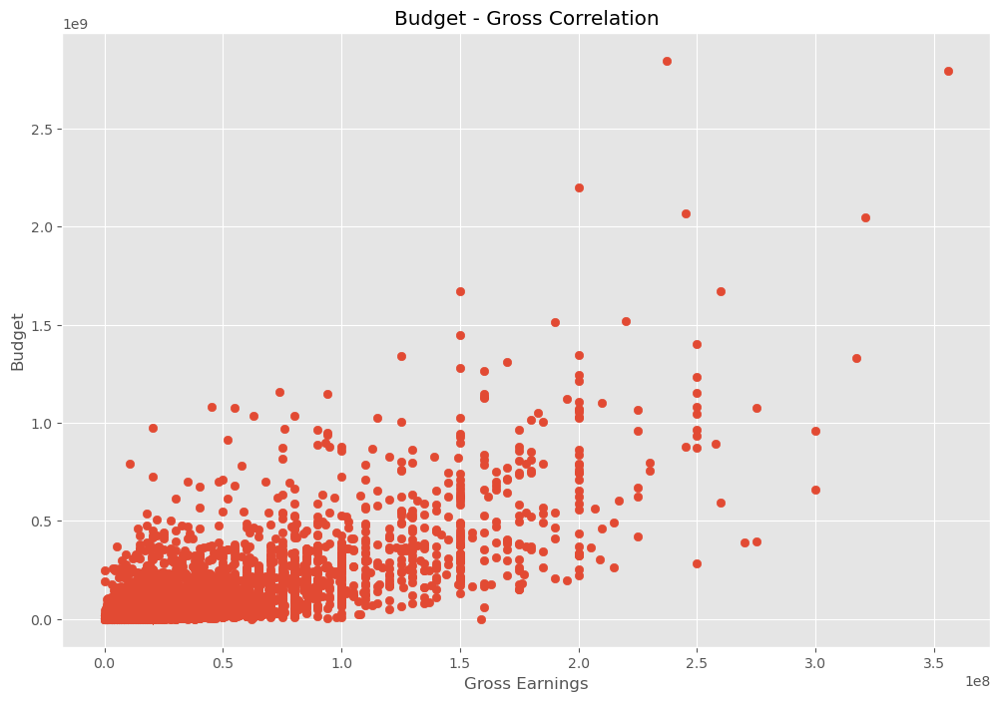

In [43]:
#Scatter plot budget - gross
plt.scatter(x=df['budget'],y=df['gross'])
plt.title('Budget - Gross Correlation')
plt.xlabel('Gross Earnings')
plt.ylabel('Budget')
plt.show()

<Axes: xlabel='budget', ylabel='gross'>

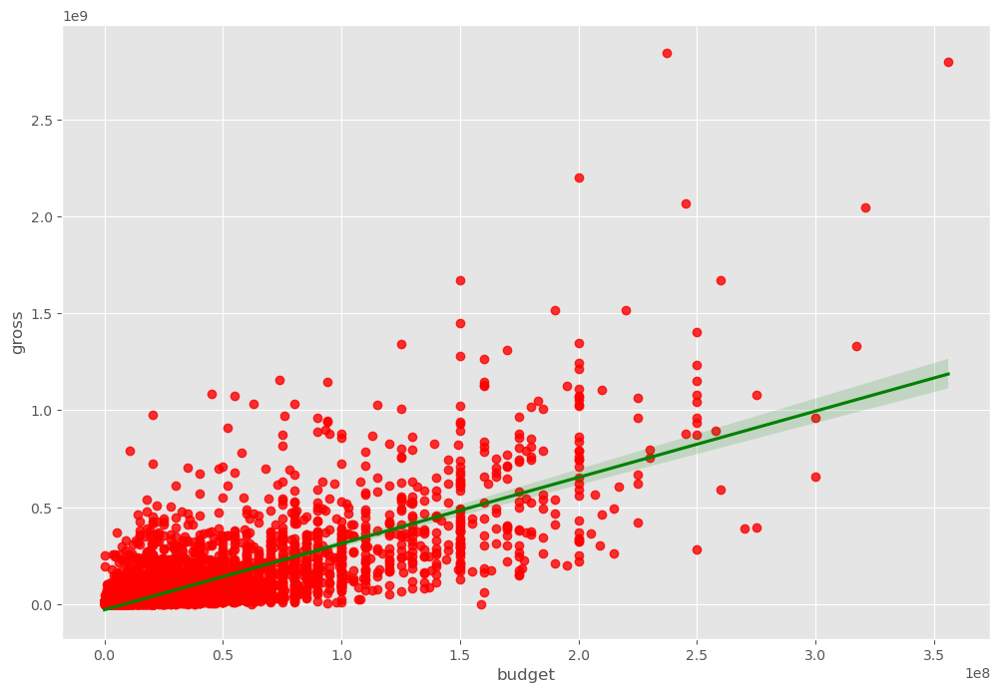

In [44]:
#Regression plot Budget - gross using seaborn
sns.regplot(x=df['budget'],y=df['gross'], scatter_kws={"color":"red"},line_kws={"color":"green"})

In [45]:
#Correlation matrix
corr_matrix = df.corr(numeric_only=True)

In [46]:
corr_matrix

,rating,year,score,votes,budget,gross,runtime
rating,1.000000,0.070055,0.069722,-0.001498,-0.215237,-0.190695,0.108951
year,0.070055,1.000000,0.097936,0.222810,0.291690,0.259504,0.120766
score,0.069722,0.097936,1.000000,0.409182,0.061970,0.185579,0.399329
votes,-0.001498,0.222810,0.409182,1.000000,0.460864,0.632088,0.309166
budget,-0.215237,0.291690,0.061970,0.460864,1.000000,0.745881,0.273345
gross,-0.190695,0.259504,0.185579,0.632088,0.745881,1.000000,0.244353
runtime,0.108951,0.120766,0.399329,0.309166,0.273345,0.244353,1.000000


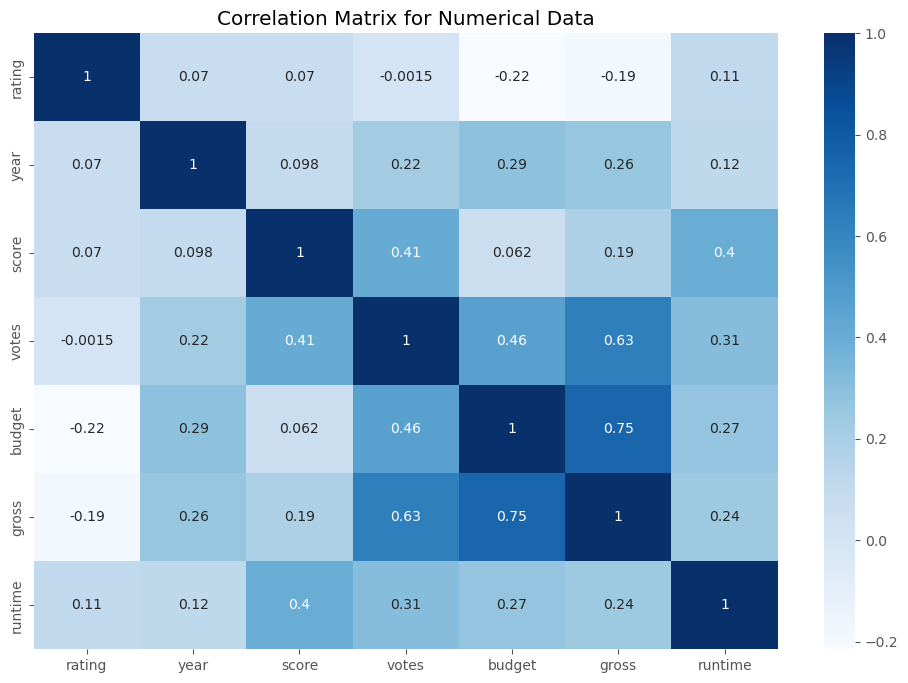

In [48]:
sns.heatmap(corr_matrix,cmap='Blues',annot=True)
plt.title('Correlation Matrix for Numerical Data')
plt.show()

Thấy gross và budget highly correlated

In [54]:
#Numerize df
df_numerized=df

In [55]:
for col in df_numerized:
    if (df_numerized[col].dtype=='object'):
        df_numerized[col]=df_numerized[col].astype('category')
        df_numerized[col]=df_numerized[col].cat.codes
df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,4.000000,6,1980,1705,8.400000,9.270000e+05,2589,4014,1047,54,19000000,46998772,2319,146.000000
1,The Blue Lagoon,4.000000,1,1980,1492,5.800000,6.500000e+04,2269,1632,327,55,4500000,58853106,731,104.000000
2,Star Wars: Episode V - The Empire Strikes Back,2.000000,0,1980,1771,8.700000,1.200000e+06,1111,2567,1745,55,18000000,538375067,1540,124.000000
3,Airplane!,2.000000,4,1980,1492,7.700000,2.210000e+05,1301,2000,2246,55,3500000,83453539,1812,88.000000
4,Caddyshack,4.000000,4,1980,1543,7.300000,1.080000e+05,1054,521,410,55,6000000,39846344,1777,98.000000
5,Friday the 13th,4.000000,10,1980,2502,6.400000,1.230000e+05,2528,4362,241,55,550000,39754601,-1,95.000000
6,The Blues Brothers,4.000000,0,1980,1771,7.900000,1.880000e+05,1412,838,1277,55,27000000,115229890,2281,133.000000
7,Raging Bull,4.000000,3,1980,699,8.200000,3.300000e+05,1829,1769,2240,55,18000000,23402427,631,129.000000
8,Superman II,2.000000,0,1980,1753,6.800000,1.010000e+05,2306,1979,877,55,54000000,108185706,883,127.000000
9,The Long Riders,4.000000,3,1980,2286,7.000000,1.000000e+04,2864,423,589,55,10000000,15795189,2272,100.000000


In [56]:
#Correlation matrix for numerized df
corr_matrix2 = df_numerized.corr(numeric_only=True)

In [57]:
corr_matrix2

,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
rating,1.000000,0.165040,0.070055,0.032589,0.069722,-0.001498,0.008903,0.006441,0.019885,-0.059657,-0.215237,-0.190695,0.066174,0.108951
genre,0.165040,1.000000,-0.081261,0.029997,0.027959,-0.145276,-0.015258,0.006746,-0.004856,-0.035896,-0.328484,-0.233385,0.099779,-0.052699
year,0.070055,-0.081261,1.000000,-0.000484,0.097936,0.222810,-0.020795,-0.007901,-0.027745,-0.069423,0.291690,0.259504,-0.038516,0.120766
released,0.032589,0.029997,-0.000484,1.000000,0.042617,0.016114,-0.001492,-0.003461,0.015550,-0.022042,0.011049,0.000721,0.028564,0.000867
score,0.069722,0.027959,0.097936,0.042617,1.000000,0.409182,0.009559,0.019795,-0.000979,-0.134577,0.061970,0.185579,0.059239,0.399329
votes,-0.001498,-0.145276,0.222810,0.016114,0.409182,1.000000,0.000260,0.000232,-0.019452,0.073582,0.460864,0.632088,-0.109974,0.309166
director,0.008903,-0.015258,-0.020795,-0.001492,0.009559,0.000260,1.000000,0.299512,0.039715,0.017926,-0.003584,-0.014758,0.004740,0.017624
writer,0.006441,0.006746,-0.007901,-0.003461,0.019795,0.000232,0.299512,1.000000,0.028745,0.014409,-0.031050,-0.023028,0.002341,-0.003698
star,0.019885,-0.004856,-0.027745,0.015550,-0.000979,-0.019452,0.039715,0.028745,1.000000,-0.014749,-0.018814,-0.001640,0.025626,0.009273
country,-0.059657,-0.035896,-0.069423,-0.022042,-0.134577,0.073582,0.017926,0.014409,-0.014749,1.000000,0.081816,0.093622,-0.150473,-0.079265


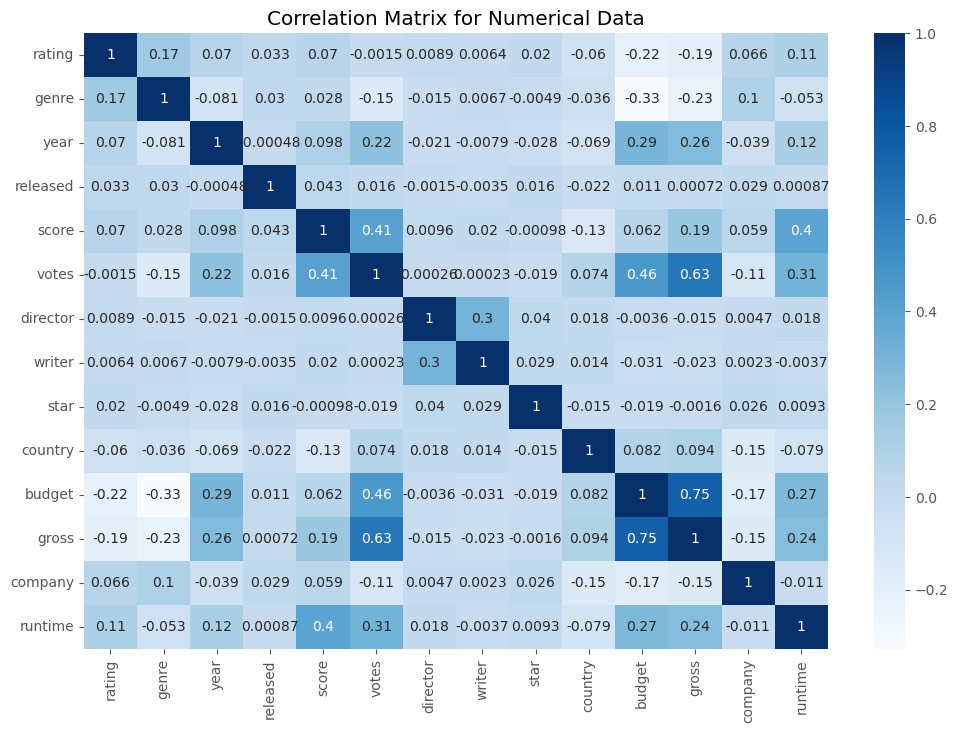

In [58]:
sns.heatmap(corr_matrix2,cmap='Blues',annot=True)
plt.title('Correlation Matrix for Numerical Data')
plt.show()

In [64]:
pairs= corr_matrix2.unstack().sort_values()
pairs

budget    genre      -0.328484
genre     budget     -0.328484
          gross      -0.233385
gross     genre      -0.233385
budget    rating     -0.215237
rating    budget     -0.215237
gross     rating     -0.190695
rating    gross      -0.190695
company   budget     -0.173442
budget    company    -0.173442
country   company    -0.150473
company   country    -0.150473
          gross      -0.147567
gross     company    -0.147567
genre     votes      -0.145276
votes     genre      -0.145276
country   score      -0.134577
score     country    -0.134577
votes     company    -0.109974
company   votes      -0.109974
genre     year       -0.081261
year      genre      -0.081261
runtime   country    -0.079265
country   runtime    -0.079265
year      country    -0.069423
country   year       -0.069423
rating    country    -0.059657
country   rating     -0.059657
genre     runtime    -0.052699
runtime   genre      -0.052699
company   year       -0.038516
year      company    -0.038516
country 

In [68]:
high_corr = pairs[pairs>0.5]
high_corr

gross     votes       0.632088
votes     gross       0.632088
gross     budget      0.745881
budget    gross       0.745881
rating    rating      1.000000
gross     gross       1.000000
budget    budget      1.000000
country   country     1.000000
star      star        1.000000
writer    writer      1.000000
director  director    1.000000
votes     votes       1.000000
score     score       1.000000
released  released    1.000000
year      year        1.000000
genre     genre       1.000000
company   company     1.000000
runtime   runtime     1.000000
dtype: float64

Vote va budget are highly correlated with gross